# GAN Project

## Import libraries

In [1]:
import torch
from torch import nn
from torch.utils.data import DataLoader
from torchvision import datasets, transforms
from torchvision.utils import make_grid
from torchvision.datasets import MNIST

import matplotlib.pyplot as plt

from tqdm.auto import tqdm

## Model Section **Conditional GAN (CGAN)** 

### Defining generator network

In [2]:
class Generator(nn.Module):
    '''
    Generator Class
    Values:
        input_dim: the dimension of the input vector, a scalar
        im_chan: the number of channels of the output image, a scalar
              (MNIST is black-and-white, so 1 channel is your default)
        hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, input_dim=10, im_chan=1, hidden_dim=64):
        super(Generator, self).__init__()
        self.input_dim = input_dim
        # Build the neural network
        self.gen = nn.Sequential(
            self.make_gen_block(input_dim, hidden_dim * 4),
            self.make_gen_block(hidden_dim * 4, hidden_dim * 2, kernel_size=4, stride=1),
            self.make_gen_block(hidden_dim * 2, hidden_dim),
            self.make_gen_block(hidden_dim, im_chan, kernel_size=4, final_layer=True),
        )

    def make_gen_block(self, input_channels, output_channels, kernel_size=3, stride=2, final_layer=False):
        '''
        Function to return a sequence of operations corresponding to a generator block of DCGAN;
        a transposed convolution, a batchnorm (except in the final layer), and an activation.
        Parameters:
            input_channels: how many channels the input feature representation has
            output_channels: how many channels the output feature representation should have
            kernel_size: the size of each convolutional filter, equivalent to (kernel_size, kernel_size)
            stride: the stride of the convolution
            final_layer: a boolean, true if it is the final layer and false otherwise 
                      (affects activation and batchnorm)
        '''
        if not final_layer:
            return nn.Sequential(
                nn.ConvTranspose2d(input_channels, output_channels, kernel_size, stride),
                nn.BatchNorm2d(output_channels),
                nn.ReLU(inplace=True),
            )
        else:
            return nn.Sequential(
                nn.ConvTranspose2d(input_channels, output_channels, kernel_size, stride),
                nn.Tanh(),
            )

    def forward(self, noise):
        '''
        Function for completing a forward pass of the generator: Given a noise tensor, 
        returns generated images.
        Parameters:
            noise: a noise tensor with dimensions (n_samples, input_dim)
        '''
        x = noise.view(len(noise), self.input_dim, 1, 1)
        return self.gen(x)

def get_noise(n_samples, input_dim, device='cpu'):
    '''
    Function for creating noise vectors: Given the dimensions (n_samples, input_dim)
    creates a tensor of that shape filled with random numbers from the normal distribution.
    Parameters:
        n_samples: the number of samples to generate, a scalar
        input_dim: the dimension of the input vector, a scalar
        device: the device type
    '''
    return torch.randn(n_samples, input_dim, device=device)

### Defining discriminator network 

In [3]:
class Discriminator(nn.Module):
    '''
    Discriminator Class
    Values:
      im_chan: the number of channels of the output image, a scalar
            (MNIST is black-and-white, so 1 channel is your default)
      hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, im_chan=1, hidden_dim=64):
        super(Discriminator, self).__init__()
        self.disc = nn.Sequential(
            self.make_disc_block(im_chan, hidden_dim),
            self.make_disc_block(hidden_dim, hidden_dim * 2),
            self.make_disc_block(hidden_dim * 2, 1, final_layer=True),
        )

    def make_disc_block(self, input_channels, output_channels, kernel_size=4, stride=2, final_layer=False):
        '''
        Function to return a sequence of operations corresponding to a discriminator block of the DCGAN; 
        a convolution, a batchnorm (except in the final layer), and an activation (except in the final layer).
        Parameters:
            input_channels: how many channels the input feature representation has
            output_channels: how many channels the output feature representation should have
            kernel_size: the size of each convolutional filter, equivalent to (kernel_size, kernel_size)
            stride: the stride of the convolution
            final_layer: a boolean, true if it is the final layer and false otherwise 
                      (affects activation and batchnorm)
        '''
        if not final_layer:
            return nn.Sequential(
                nn.Conv2d(input_channels, output_channels, kernel_size, stride),
                nn.BatchNorm2d(output_channels),
                nn.LeakyReLU(0.2, inplace=True),
            )
        else:
            return nn.Sequential(
                nn.Conv2d(input_channels, output_channels, kernel_size, stride),
            )

    def forward(self, image):
        '''
        Function for completing a forward pass of the discriminator: Given an image tensor, 
        returns a 1-dimension tensor representing fake/real.
        Parameters:
            image: a flattened image tensor with dimension (im_chan)
        '''
        disc_pred = self.disc(image)
        return disc_pred.view(len(disc_pred), -1)

### Training
`criterion:` the loss function

`n_epochs:` the number of times you iterate through the entire dataset when training

`z_dim:` the dimension of the noise vector

`display_step:` how often to display/visualize the images

`batch_size:` the number of images per forward/backward pass

`lr:` the learning rate

`device:` the device type

In [4]:
import torch.nn.functional as F
def get_one_hot_labels(labels, n_classes):
    '''
    Function for creating one-hot vectors for the labels, returns a tensor of shape (?, num_classes).
    Parameters:
        labels: tensor of labels from the dataloader, size (?)
        n_classes: the total number of classes in the dataset, an integer scalar
    '''
    return F.one_hot(labels,n_classes)

In [5]:
def combine_vectors(x, y):
    '''
    Function for combining two vectors with shapes (n_samples, ?) and (n_samples, ?).
    Parameters:
      x: (n_samples, ?) the first vector. 
        In this assignment, this will be the noise vector of shape (n_samples, z_dim), 
        but you shouldn't need to know the second dimension's size.
      y: (n_samples, ?) the second vector.
        Once again, in this assignment this will be the one-hot class vector 
        with the shape (n_samples, n_classes), but you shouldn't assume this in your code.
    '''
    combined = torch.cat((x.float(),y.float()), 1)
    return combined

In [6]:
img_shape = (1, 28, 28)
n_classes = 10

In [8]:
criterion = nn.BCEWithLogitsLoss()
n_epochs = 30
z_dim = 64
display_step = 300
batch_size = 128
lr = 0.0002
device = "cuda" if torch.cuda.is_available() else "cpu"

transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.5,), (0.5,)),
])

## get the dataset and load the dataset to dataloader
dataloader = DataLoader(
    MNIST('.', download=True, transform=transform),
    batch_size=batch_size,
    shuffle=True)

  0%|          | 0/9912422 [00:00<?, ?it/s]

Extracting ./MNIST/raw/train-images-idx3-ubyte.gz to ./MNIST/raw



  0%|          | 0/28881 [00:00<?, ?it/s]

Extracting ./MNIST/raw/train-labels-idx1-ubyte.gz to ./MNIST/raw



  0%|          | 0/1648877 [00:00<?, ?it/s]

Extracting ./MNIST/raw/t10k-images-idx3-ubyte.gz to ./MNIST/raw



  0%|          | 0/4542 [00:00<?, ?it/s]

Extracting ./MNIST/raw/t10k-labels-idx1-ubyte.gz to ./MNIST/raw



In [9]:
def get_input_dimensions(z_dim, img_shape, n_classes):
    '''
    Function for getting the size of the conditional input dimensions 
    from z_dim, the image shape, and number of classes.
    Parameters:
        z_dim: the dimension of the noise vector, a scalar
        img_shape: the shape of each image as (C, W, H), which is (1, 28, 28)
        n_classes: the total number of classes in the dataset, an integer scalar
    Returns: 
        generator_input_dim: the input dimensionality of the conditional generator, 
                          which takes the noise and class vectors
        discriminator_im_chan: the number of input channels to the discriminator
                            (e.g. C x 28 x 28)
    '''
    generator_input_dim = z_dim + n_classes
    discriminator_im_chan = img_shape[0] + n_classes

    return generator_input_dim, discriminator_im_chan

In [10]:
generator_input_dim, discriminator_im_chan = get_input_dimensions(z_dim, img_shape, n_classes)

gen = Generator(input_dim=generator_input_dim).to(device)
gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
disc = Discriminator(im_chan=discriminator_im_chan).to(device)
disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)

def weights_init(m):
    if isinstance(m, nn.Conv2d) or isinstance(m, nn.ConvTranspose2d):
        torch.nn.init.normal_(m.weight, 0.0, 0.02)
    if isinstance(m, nn.BatchNorm2d):
        torch.nn.init.normal_(m.weight, 0.0, 0.02)
        torch.nn.init.constant_(m.bias, 0)
gen = gen.apply(weights_init)
disc = disc.apply(weights_init)

In [11]:
def show_tensor_images(image_tensor, num_images=25, size=(1, 28, 28), nrow=5, show=True):
    '''
    Function for visualizing images: Given a tensor of images, number of images, and
    size per image, plots and prints the images in an uniform grid.
    '''
    image_tensor = (image_tensor + 1) / 2
    image_unflat = image_tensor.detach().cpu()
    image_grid = make_grid(image_unflat[:num_images], nrow=nrow)
    plt.imshow(image_grid.permute(1, 2, 0).squeeze())
    if show:
        plt.show()

  0%|          | 0/469 [00:00<?, ?it/s]

Step 300: Generator loss: 1.610014877319336, discriminator loss: 0.3394759825989604


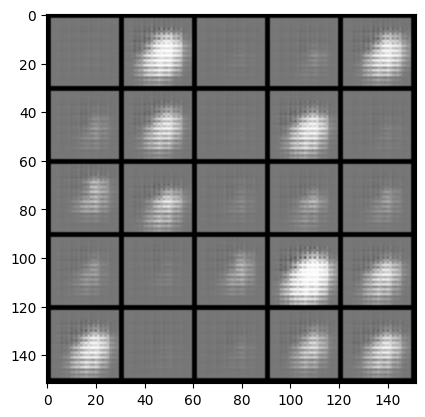

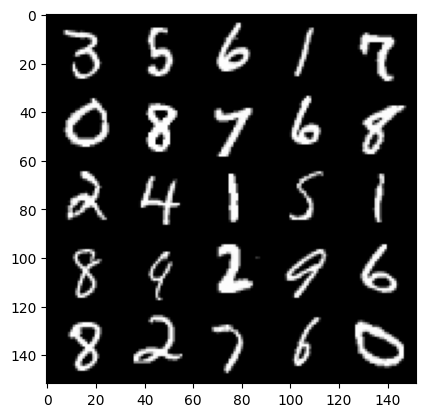

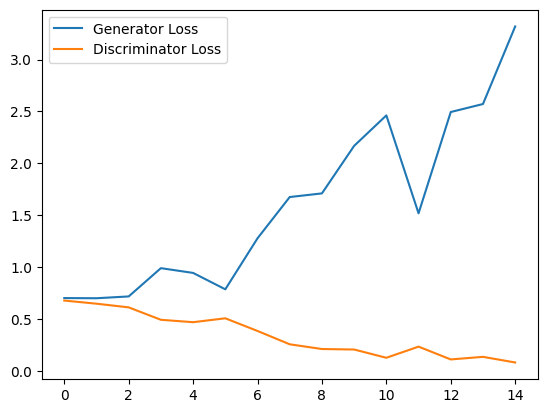

  0%|          | 0/469 [00:00<?, ?it/s]

Step 600: Generator loss: 3.22169531305631, discriminator loss: 0.07121938702339928


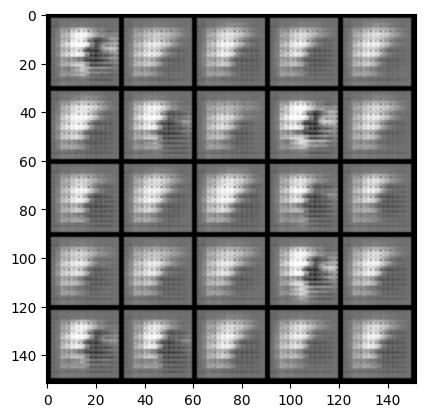

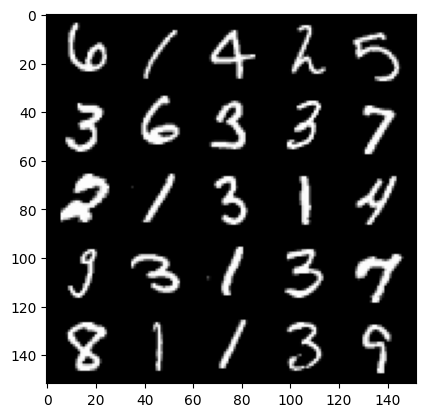

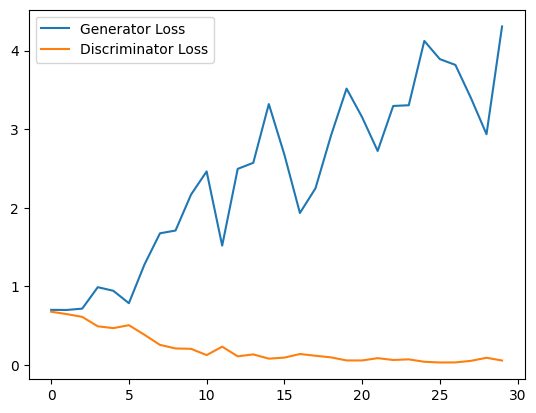

Step 900: Generator loss: 4.499471164544423, discriminator loss: 0.07062991753220559


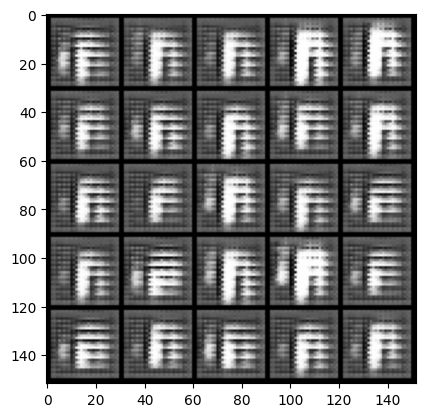

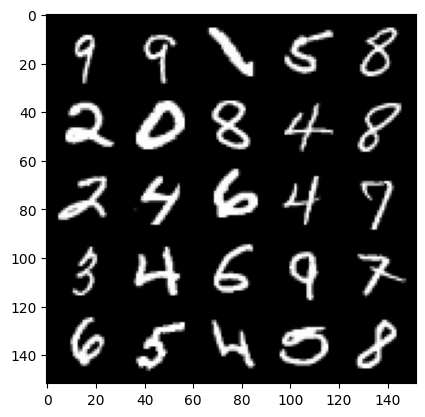

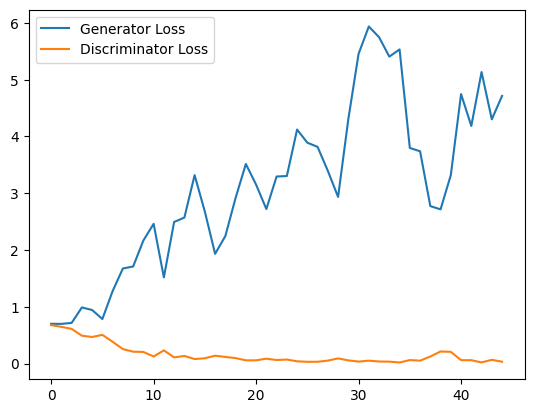

  0%|          | 0/469 [00:00<?, ?it/s]

Step 1200: Generator loss: 4.885012613932291, discriminator loss: 0.032889834474772214


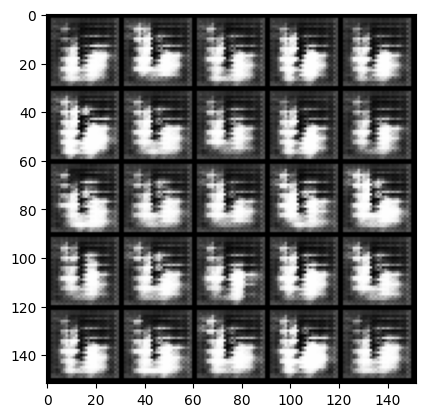

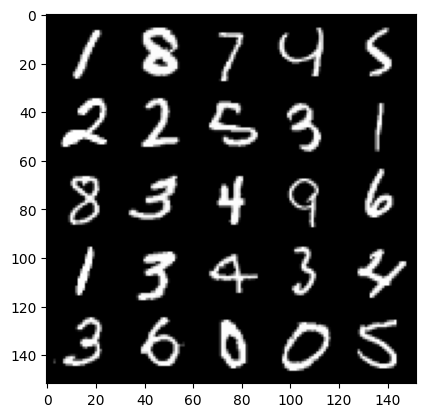

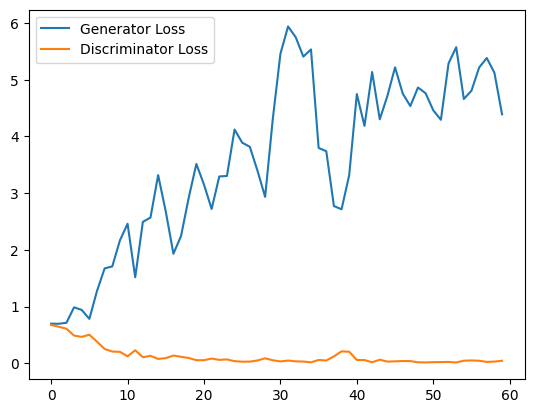

  0%|          | 0/469 [00:00<?, ?it/s]

Step 1500: Generator loss: 4.900144073963165, discriminator loss: 0.05486672878575822


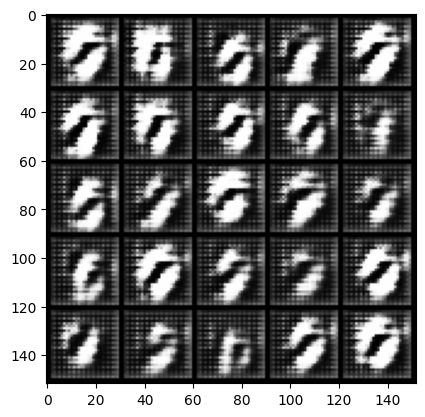

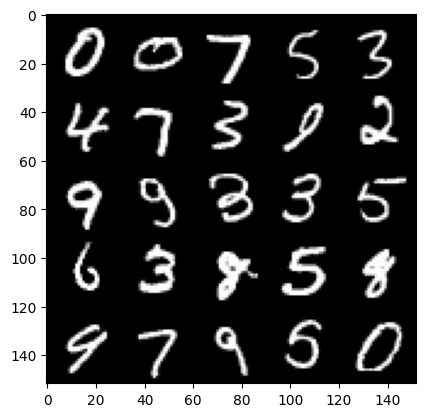

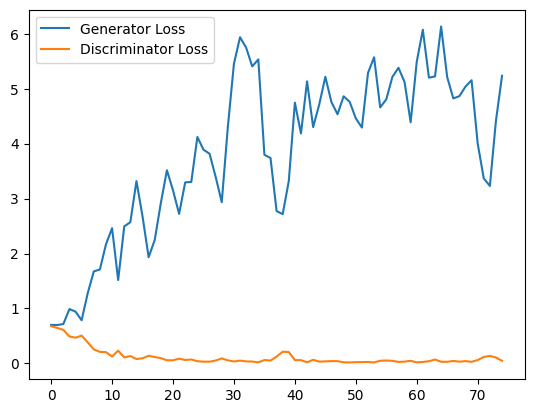

Step 1800: Generator loss: 4.182419153054555, discriminator loss: 0.06334991129736106


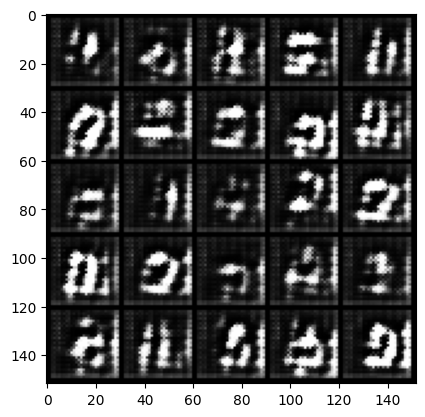

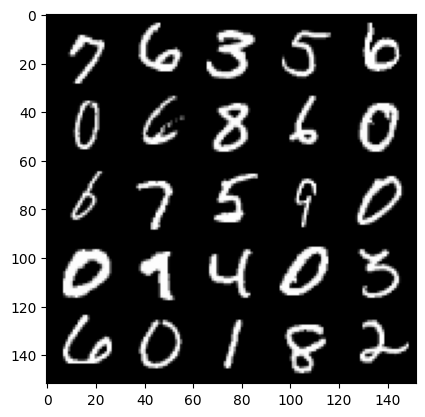

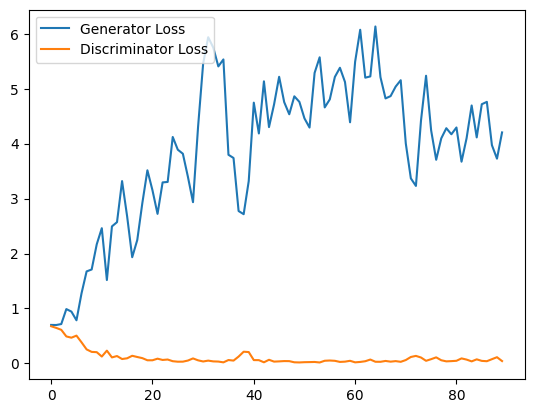

  0%|          | 0/469 [00:00<?, ?it/s]

Step 2100: Generator loss: 3.760500547885895, discriminator loss: 0.08703785798201959


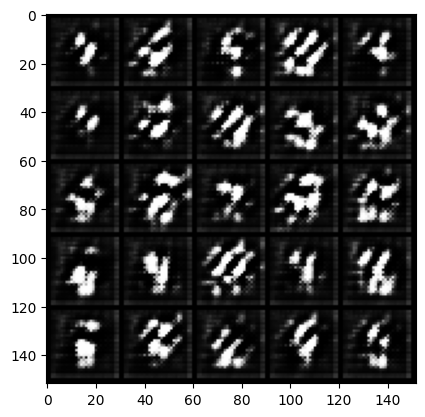

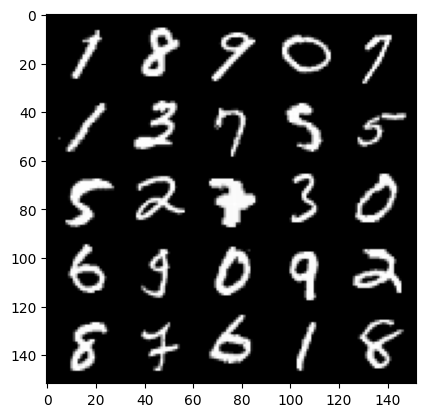

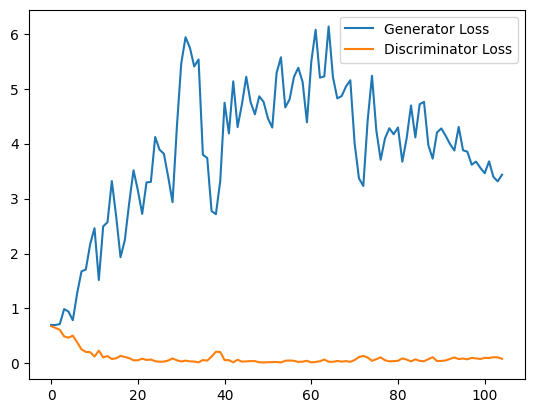

  0%|          | 0/469 [00:00<?, ?it/s]

Step 2400: Generator loss: 3.6327133846282957, discriminator loss: 0.12836072960247596


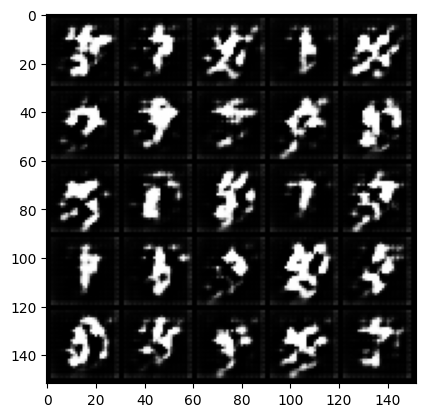

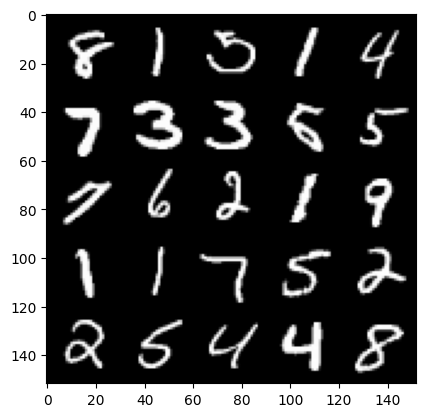

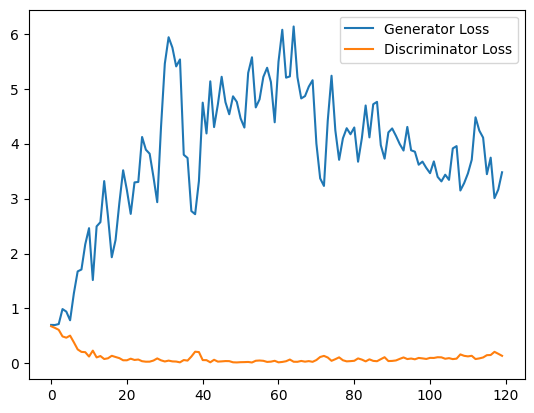

Step 2700: Generator loss: 3.005064294338226, discriminator loss: 0.22404634733994802


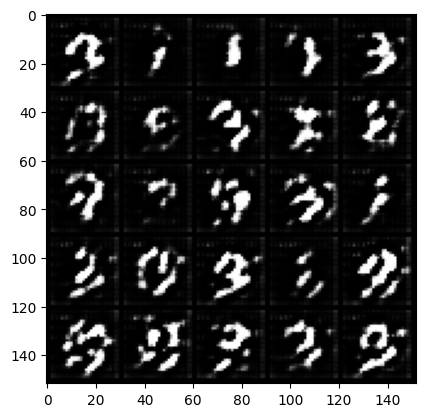

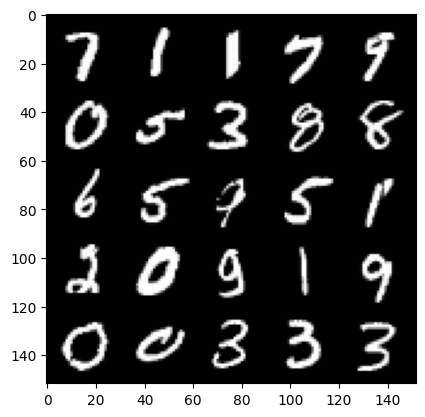

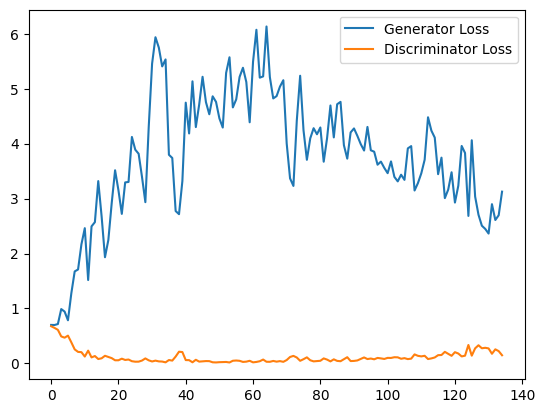

  0%|          | 0/469 [00:00<?, ?it/s]

Step 3000: Generator loss: 2.3587585361798604, discriminator loss: 0.2565216352045536


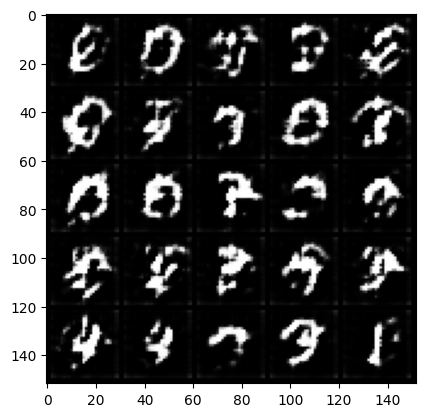

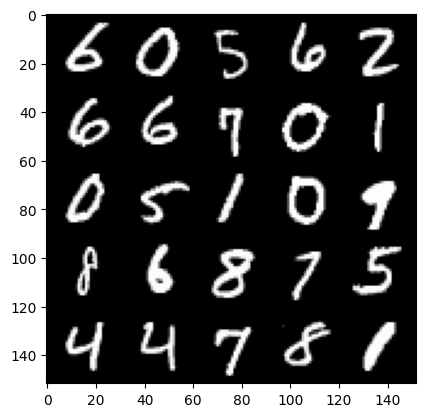

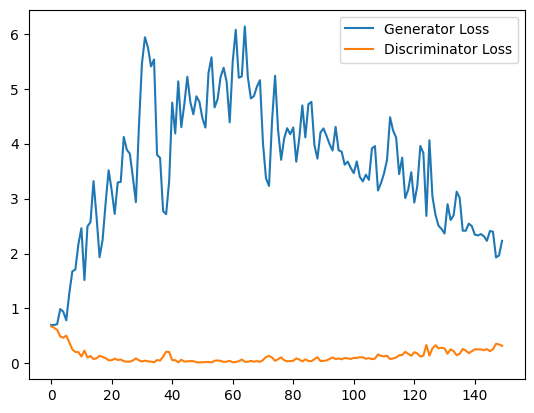

  0%|          | 0/469 [00:00<?, ?it/s]

Step 3300: Generator loss: 2.457029378414154, discriminator loss: 0.3133590504527092


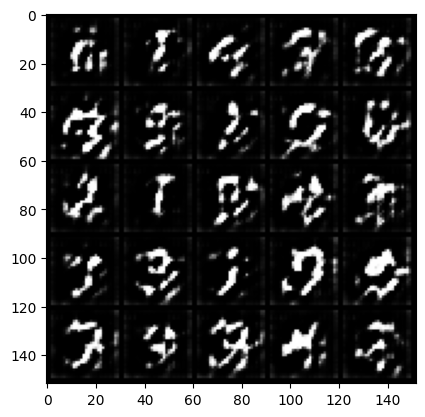

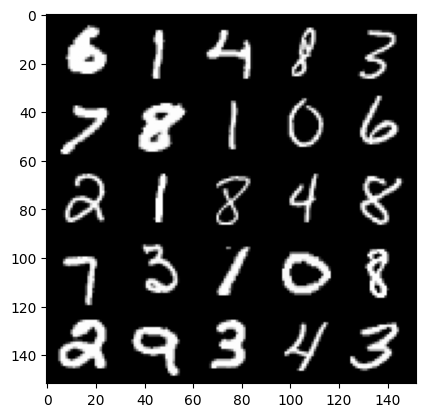

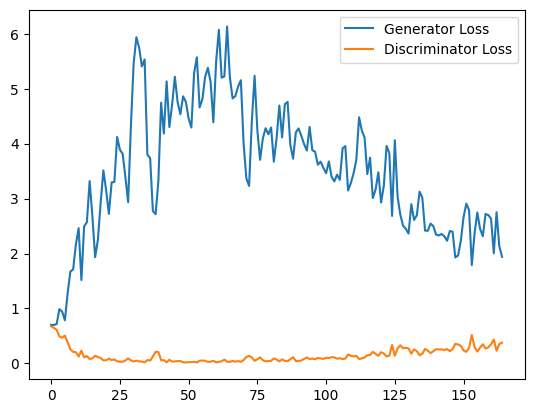

Step 3600: Generator loss: 2.0506442030270895, discriminator loss: 0.30957305043935773


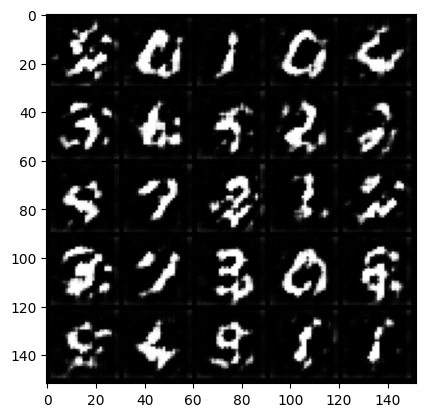

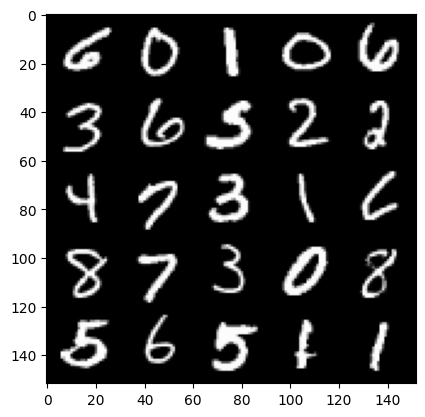

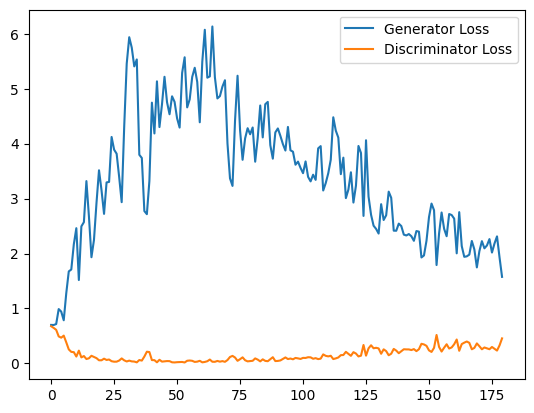

  0%|          | 0/469 [00:00<?, ?it/s]

Step 3900: Generator loss: 1.967528158823649, discriminator loss: 0.31226486633221306


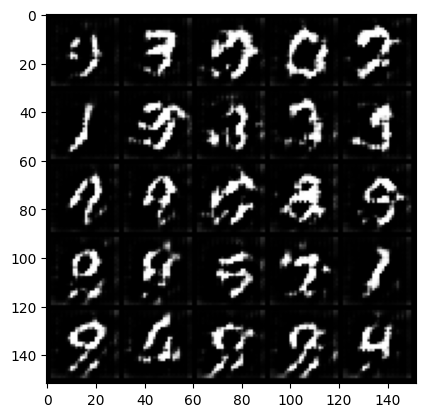

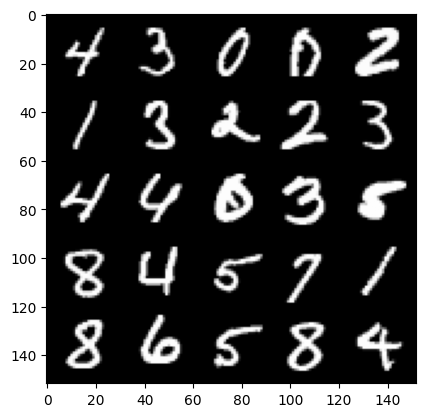

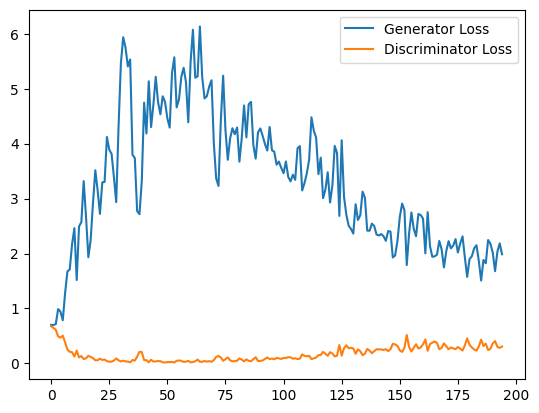

Step 4200: Generator loss: 2.1532614624500273, discriminator loss: 0.3292410759627819


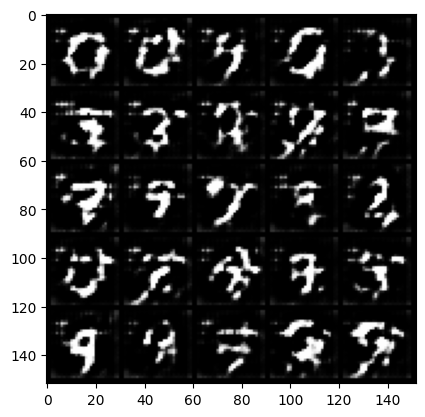

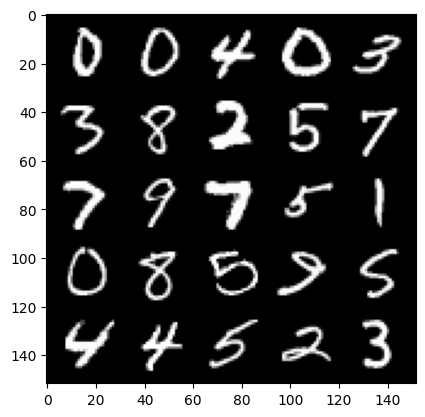

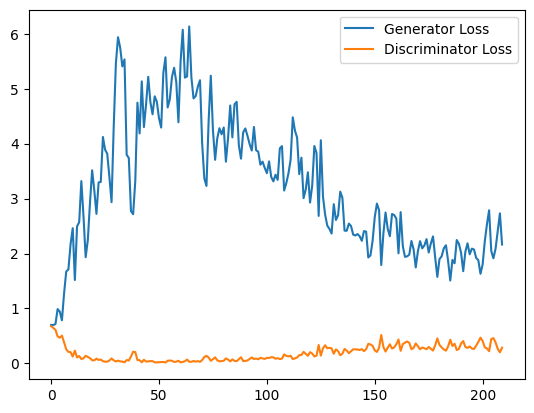

  0%|          | 0/469 [00:00<?, ?it/s]

Step 4500: Generator loss: 1.9255370489756267, discriminator loss: 0.3552563204864661


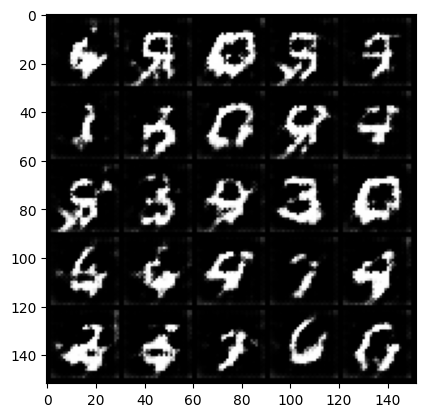

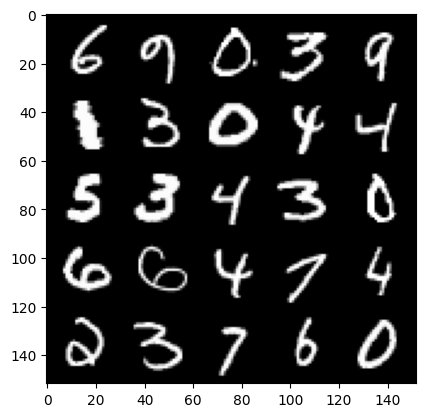

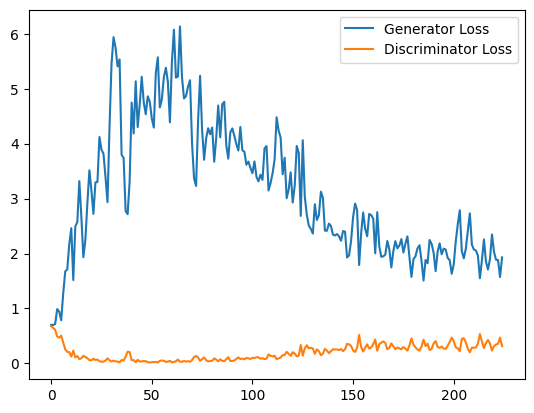

  0%|          | 0/469 [00:00<?, ?it/s]

Step 4800: Generator loss: 2.0118418312072754, discriminator loss: 0.3551676578819752


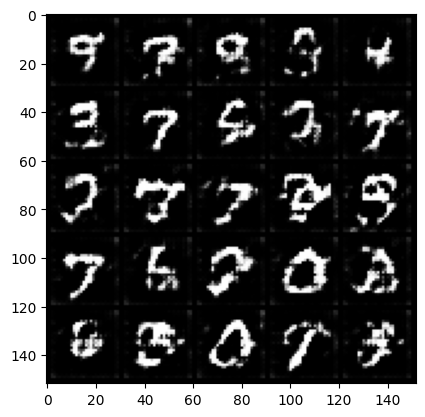

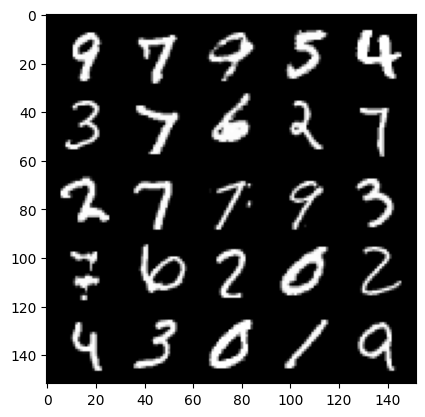

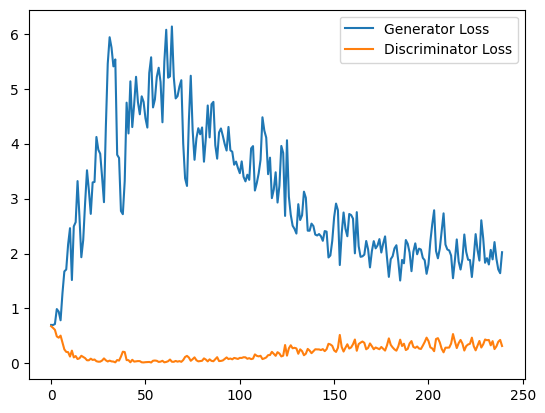

Step 5100: Generator loss: 1.873252215385437, discriminator loss: 0.3655356931189696


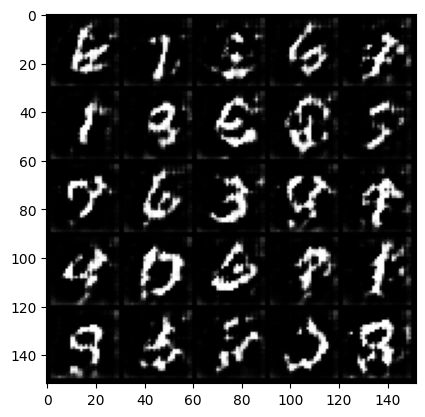

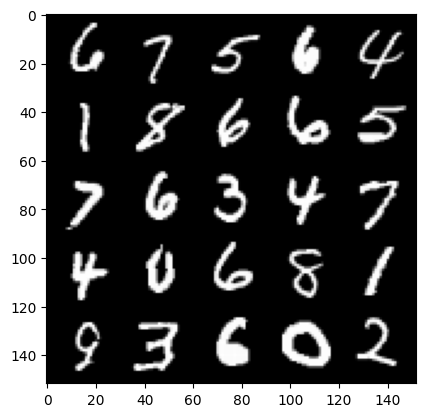

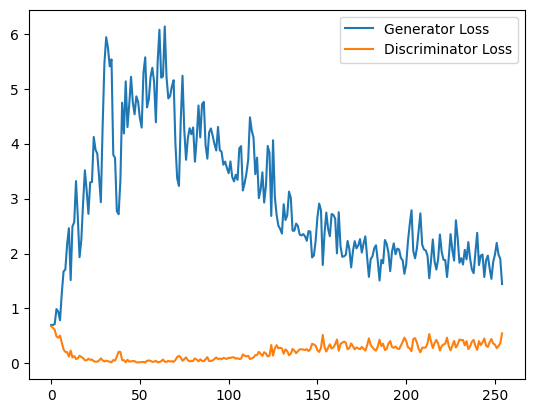

  0%|          | 0/469 [00:00<?, ?it/s]

Step 5400: Generator loss: 1.8362716575463613, discriminator loss: 0.38057123849789304


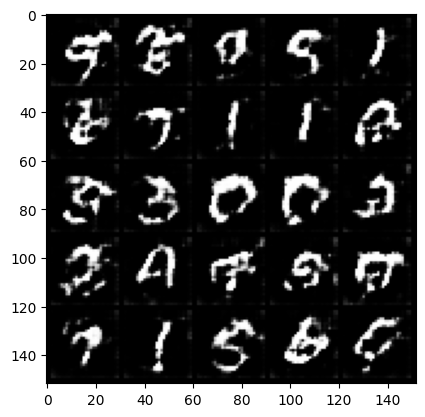

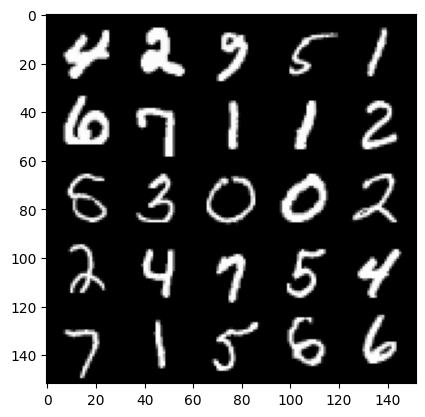

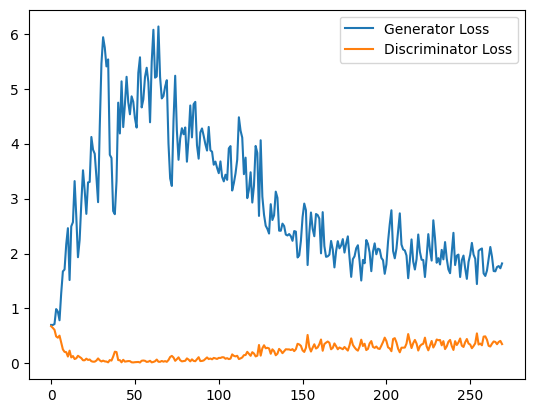

  0%|          | 0/469 [00:00<?, ?it/s]

Step 5700: Generator loss: 1.8714526744683584, discriminator loss: 0.38214621936281523


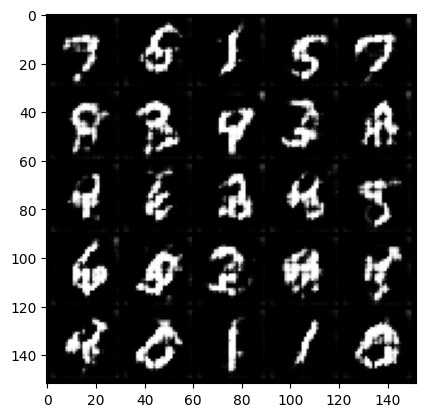

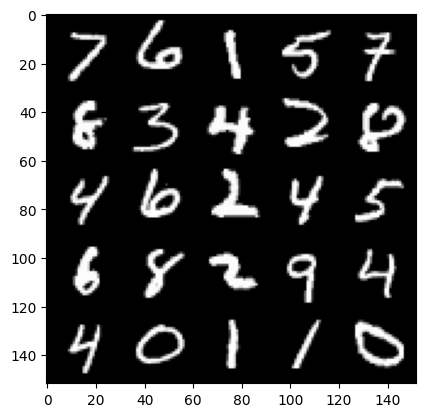

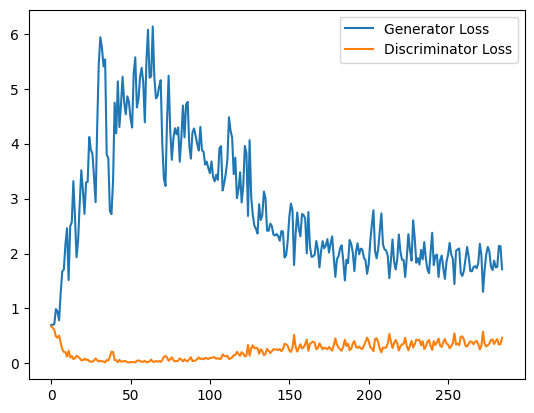

Step 6000: Generator loss: 1.9112057848771413, discriminator loss: 0.38962839340170224


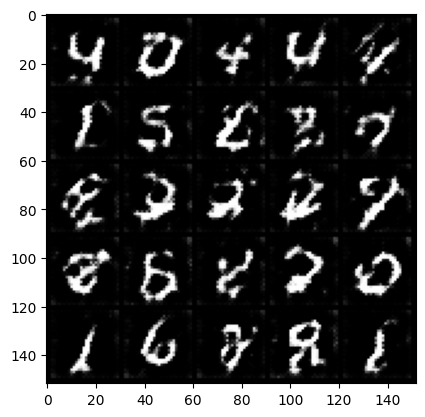

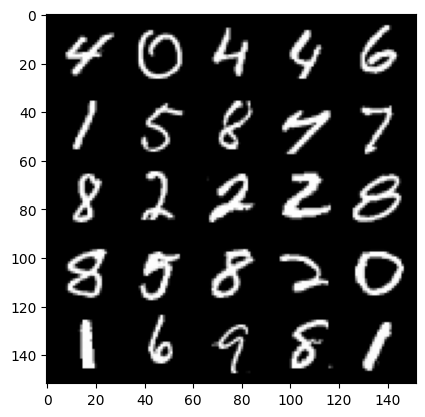

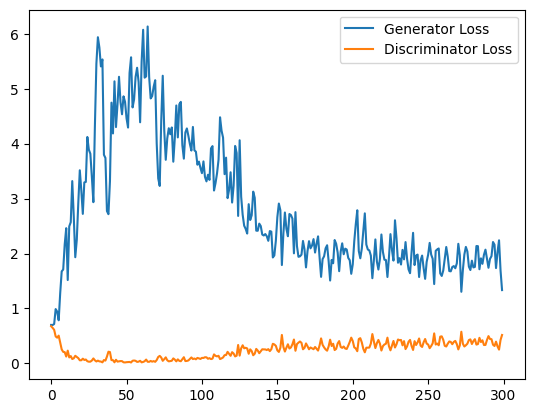

  0%|          | 0/469 [00:00<?, ?it/s]

Step 6300: Generator loss: 1.6204830320676167, discriminator loss: 0.4165506688753764


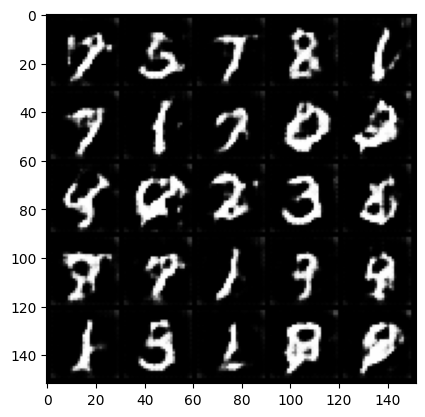

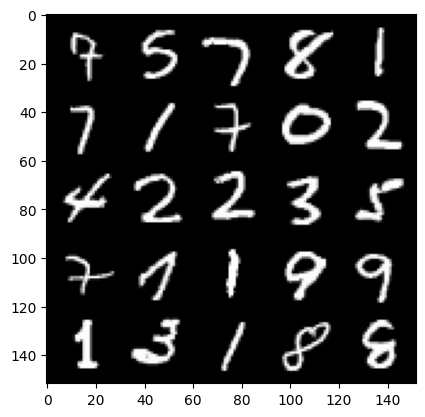

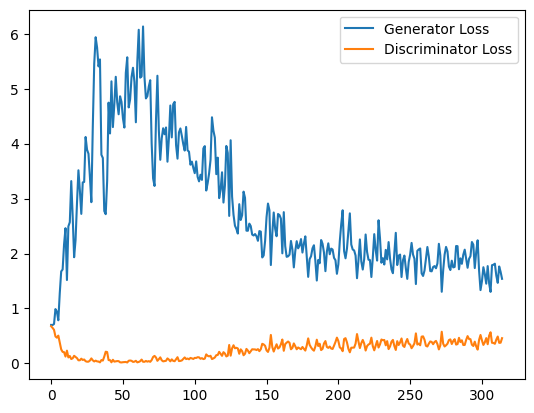

  0%|          | 0/469 [00:00<?, ?it/s]

Step 6600: Generator loss: 1.6841468811035156, discriminator loss: 0.415668464799722


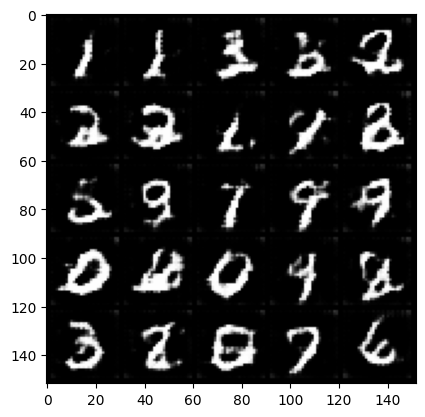

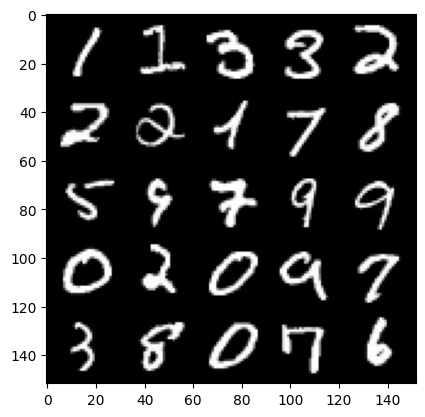

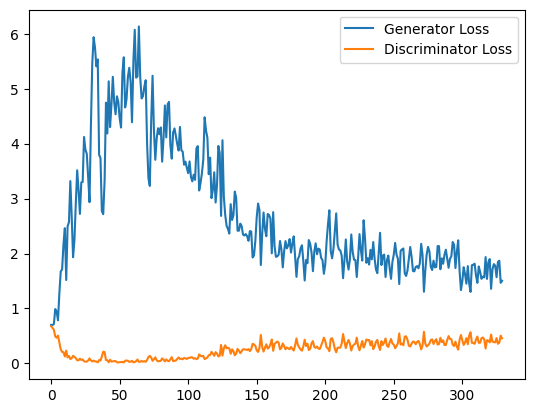

Step 6900: Generator loss: 1.671562223235766, discriminator loss: 0.41293121586243314


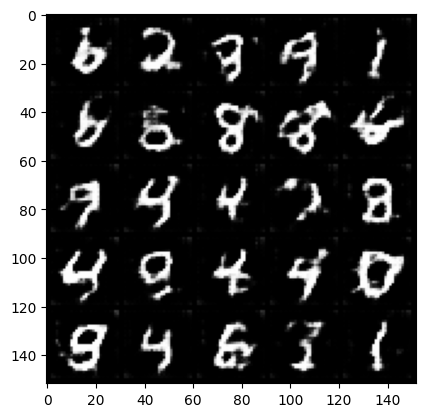

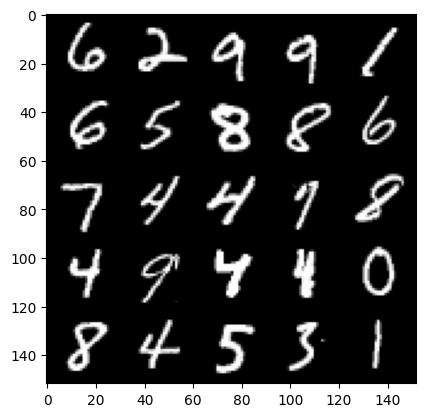

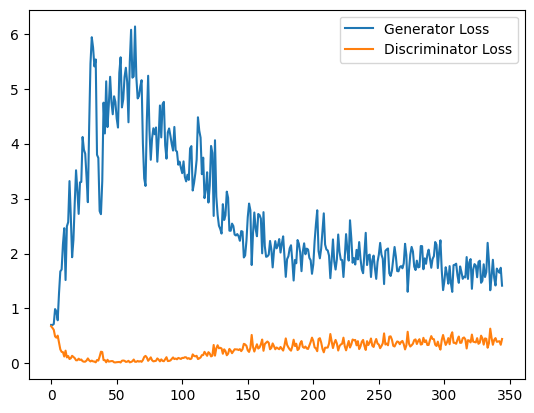

  0%|          | 0/469 [00:00<?, ?it/s]

Step 7200: Generator loss: 1.600652493039767, discriminator loss: 0.4174927417437235


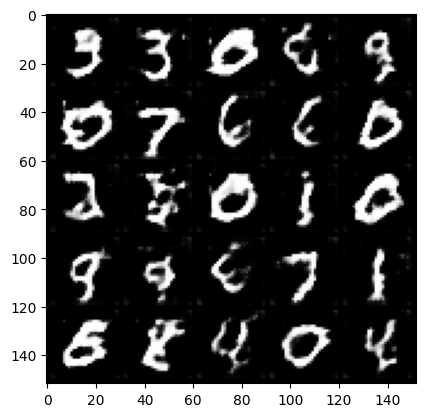

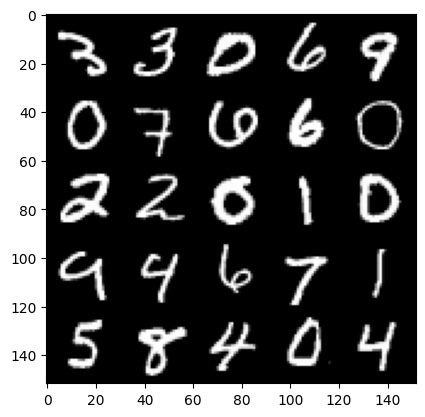

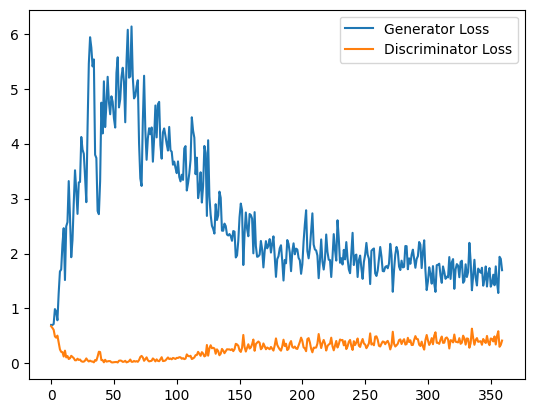

Step 7500: Generator loss: 1.5904029579957326, discriminator loss: 0.44309147556622824


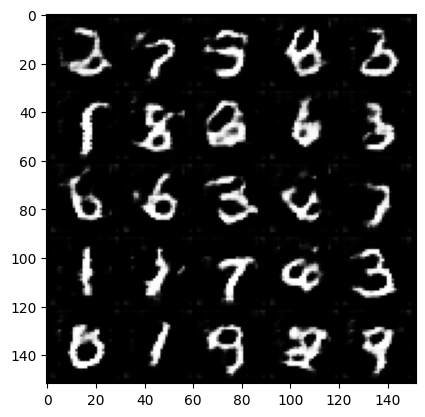

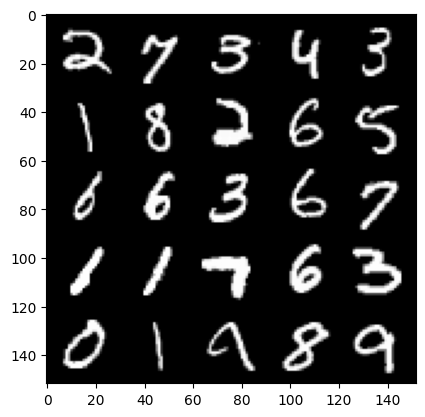

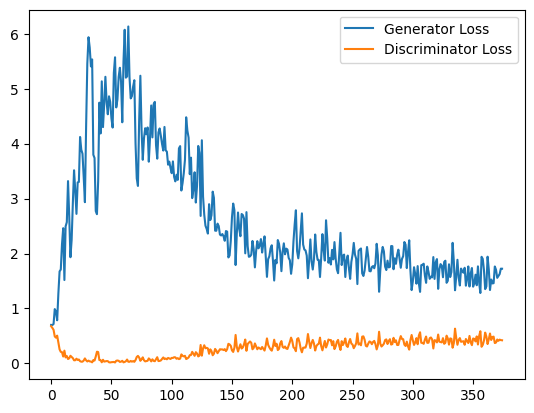

  0%|          | 0/469 [00:00<?, ?it/s]

Step 7800: Generator loss: 1.6374832151333492, discriminator loss: 0.4409017558892568


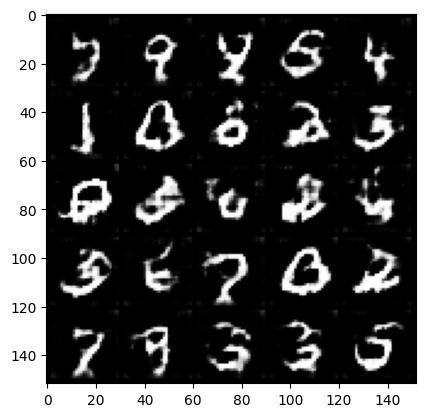

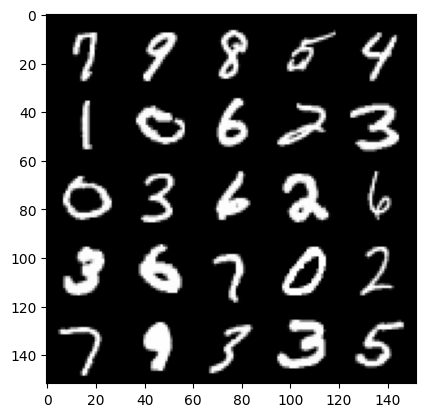

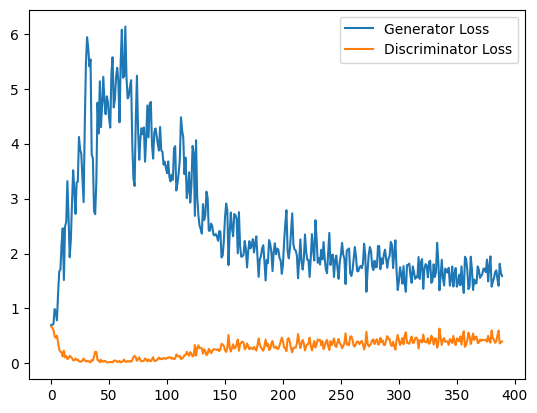

  0%|          | 0/469 [00:00<?, ?it/s]

Step 8100: Generator loss: 1.534596524834633, discriminator loss: 0.45238571479916573


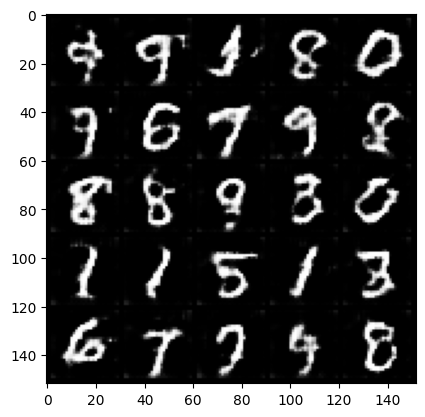

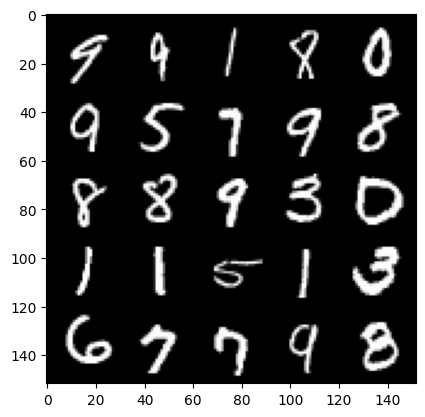

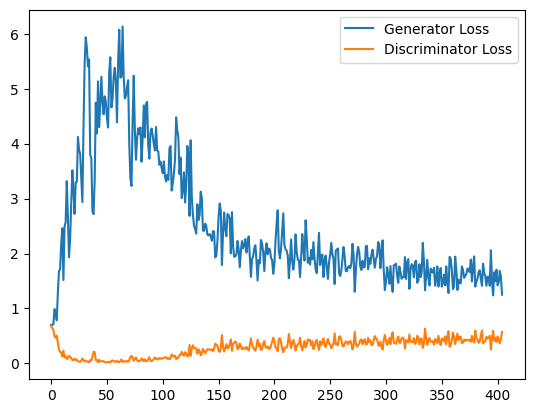

Step 8400: Generator loss: 1.4903228110074997, discriminator loss: 0.44072009603182477


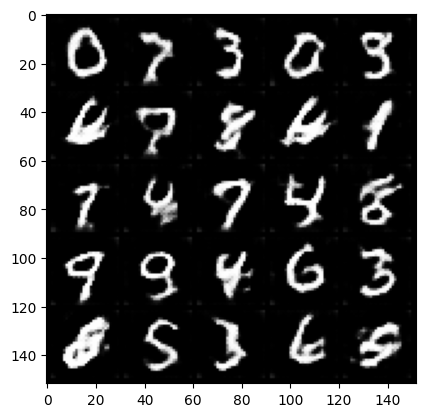

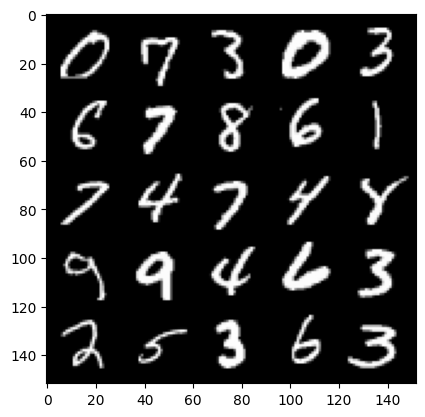

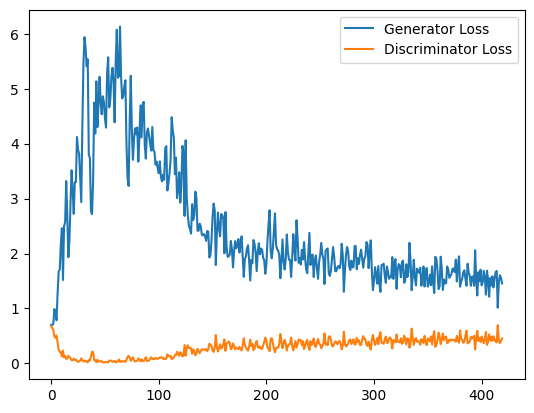

  0%|          | 0/469 [00:00<?, ?it/s]

Step 8700: Generator loss: 1.4118853741884232, discriminator loss: 0.4693448779483636


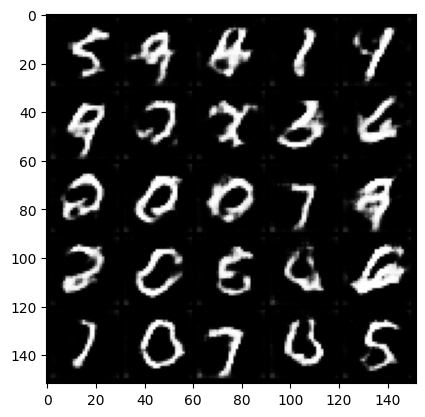

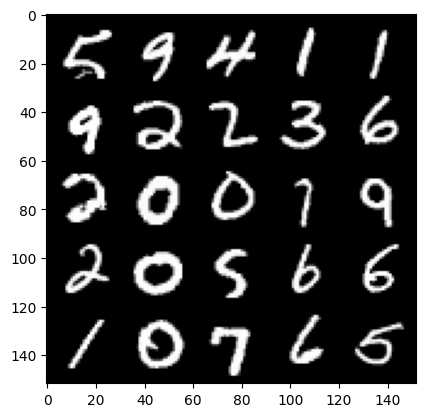

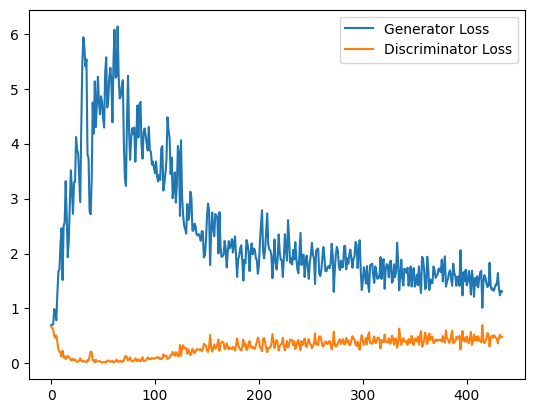

  0%|          | 0/469 [00:00<?, ?it/s]

Step 9000: Generator loss: 1.4619014167785644, discriminator loss: 0.46619214087724686


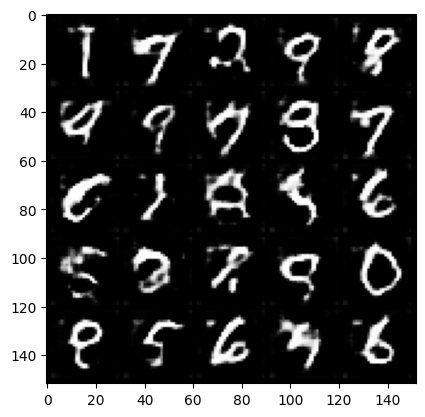

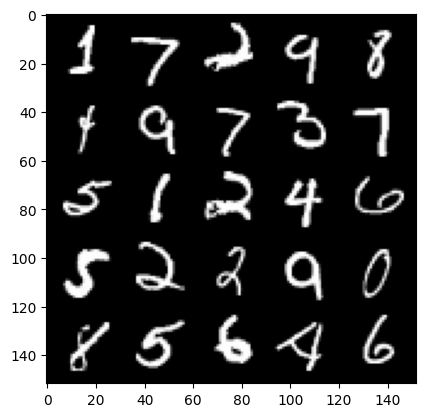

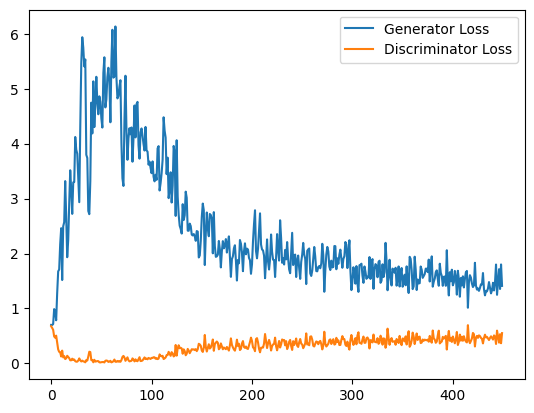

Step 9300: Generator loss: 1.5234547829627991, discriminator loss: 0.4832558971643448


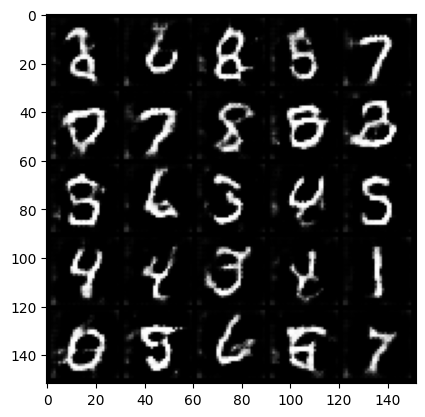

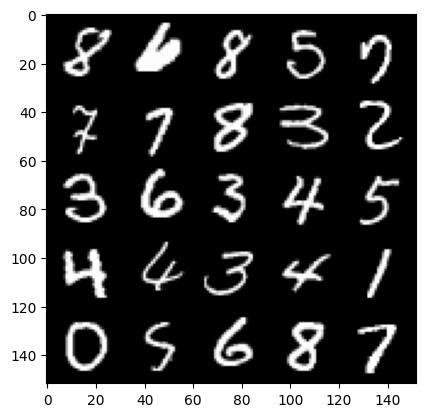

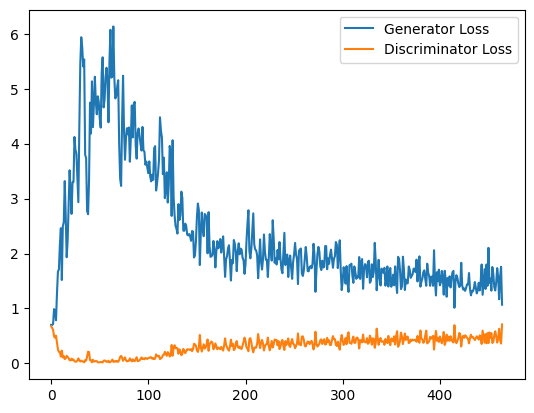

  0%|          | 0/469 [00:00<?, ?it/s]

Step 9600: Generator loss: 1.3951918590068817, discriminator loss: 0.48457205762465794


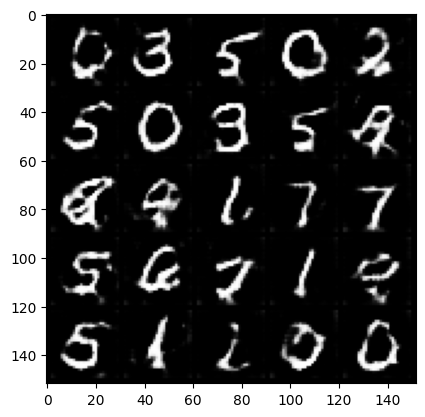

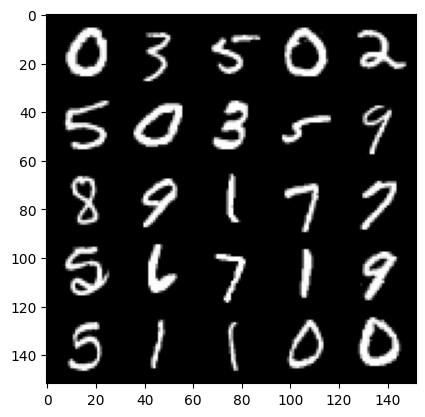

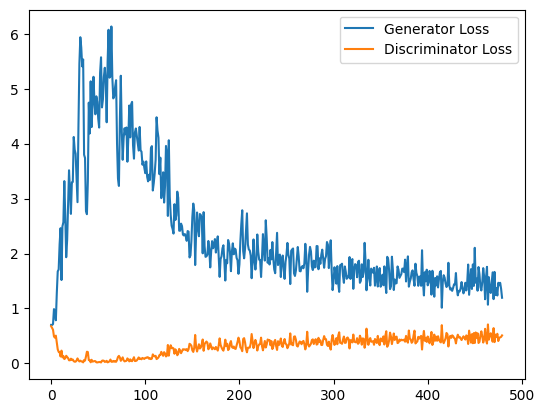

  0%|          | 0/469 [00:00<?, ?it/s]

Step 9900: Generator loss: 1.3469338291883468, discriminator loss: 0.4924480602145195


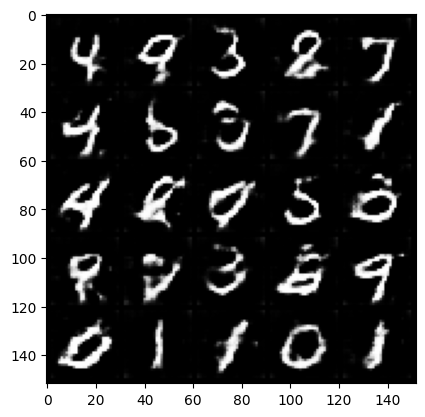

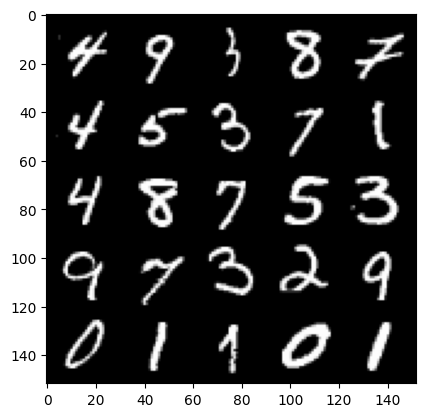

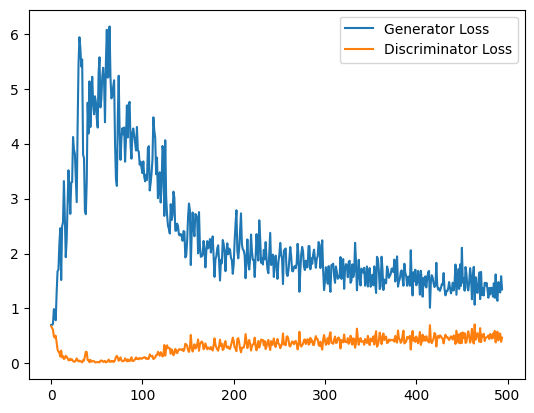

Step 10200: Generator loss: 1.370282108783722, discriminator loss: 0.5153188425302505


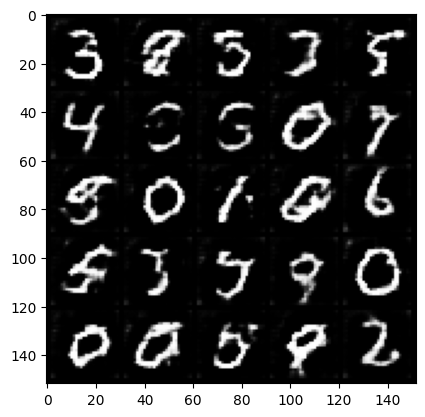

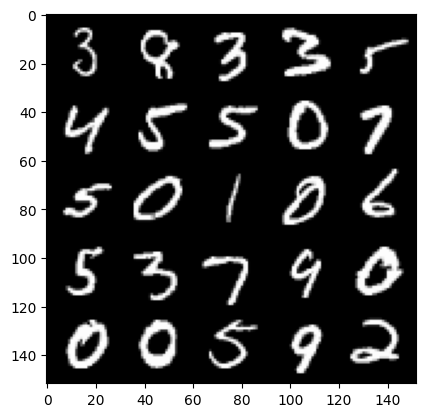

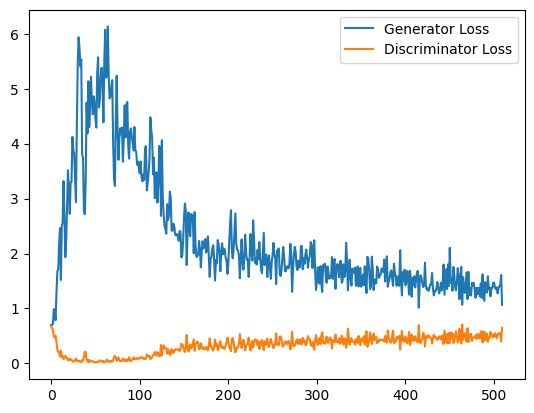

  0%|          | 0/469 [00:00<?, ?it/s]

Step 10500: Generator loss: 1.2993032505114874, discriminator loss: 0.507522334853808


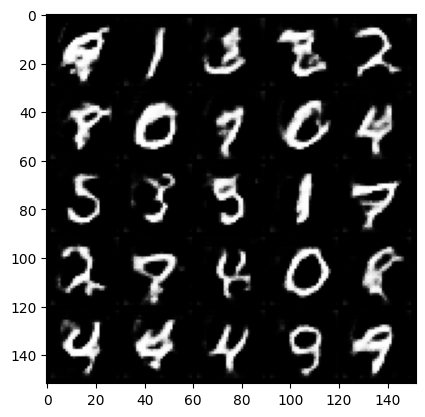

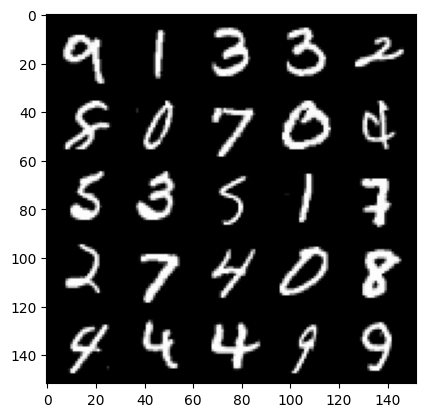

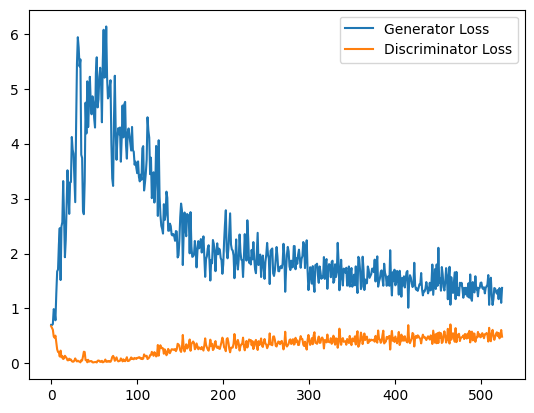

  0%|          | 0/469 [00:00<?, ?it/s]

Step 10800: Generator loss: 1.3046538867553075, discriminator loss: 0.5184486498435338


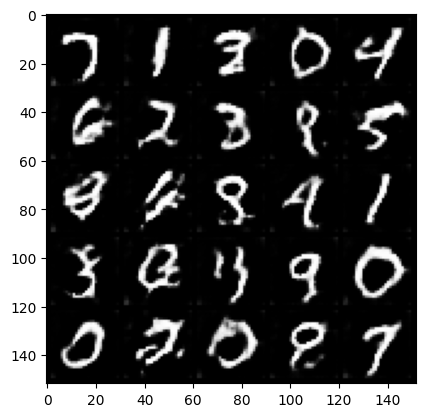

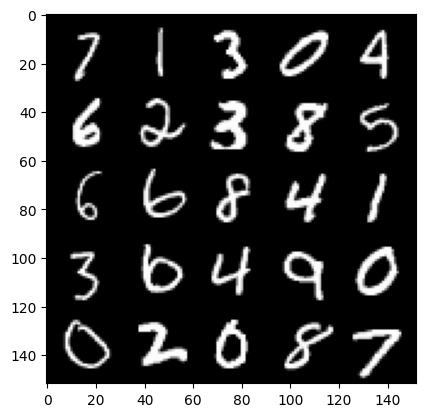

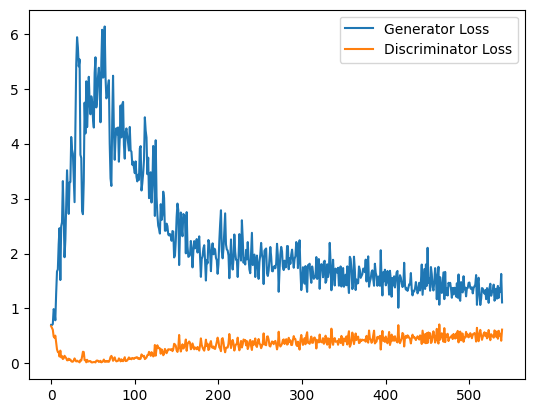

Step 11100: Generator loss: 1.2898437198003132, discriminator loss: 0.5277130396167438


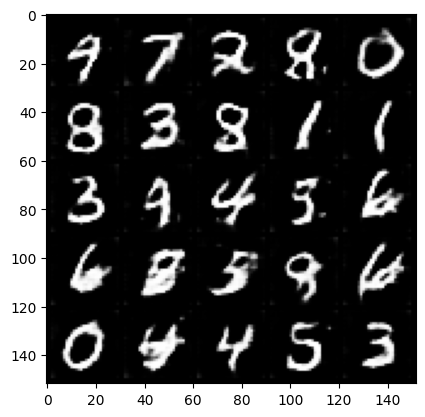

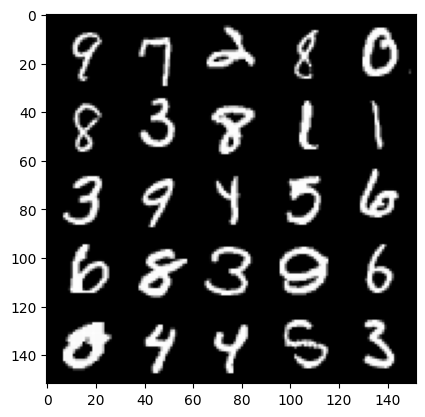

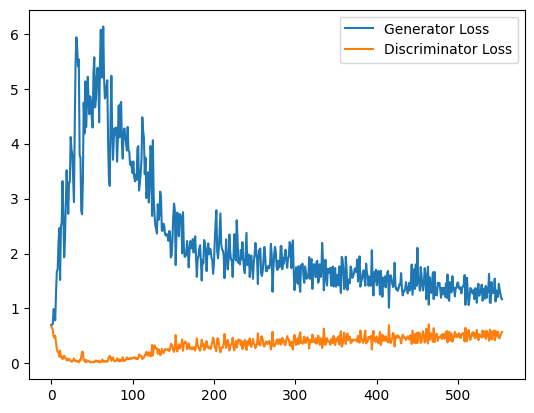

  0%|          | 0/469 [00:00<?, ?it/s]

Step 11400: Generator loss: 1.2644125286738077, discriminator loss: 0.5209908557931582


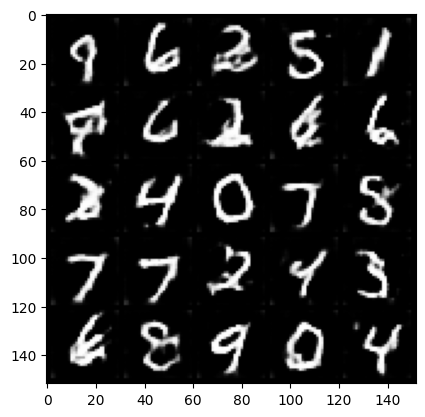

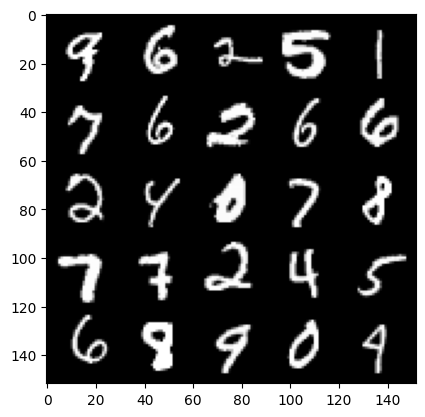

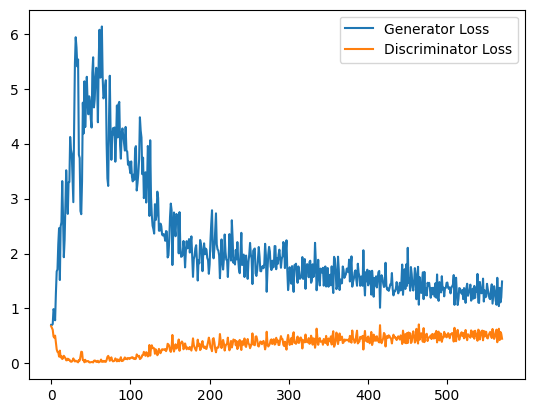

Step 11700: Generator loss: 1.2428307801485061, discriminator loss: 0.5348939256866773


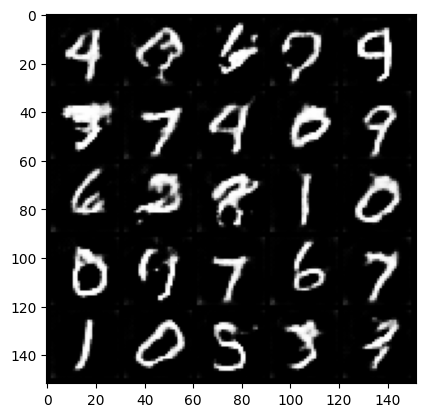

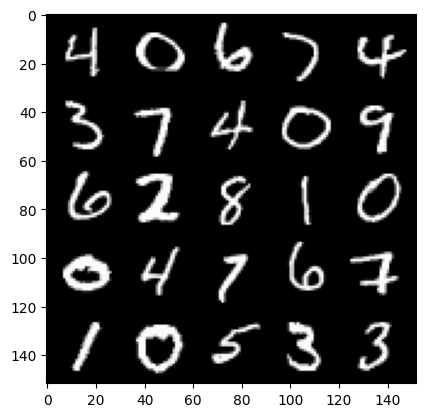

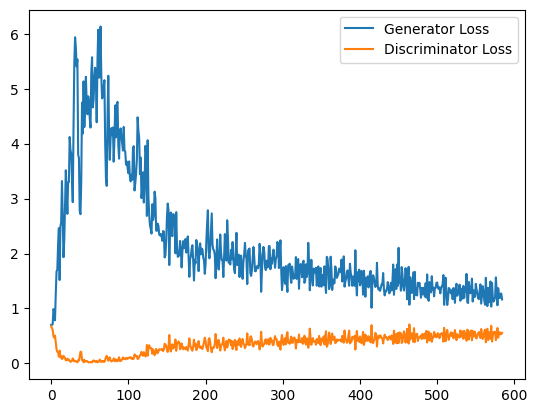

  0%|          | 0/469 [00:00<?, ?it/s]

Step 12000: Generator loss: 1.2210974782705306, discriminator loss: 0.5309598256150881


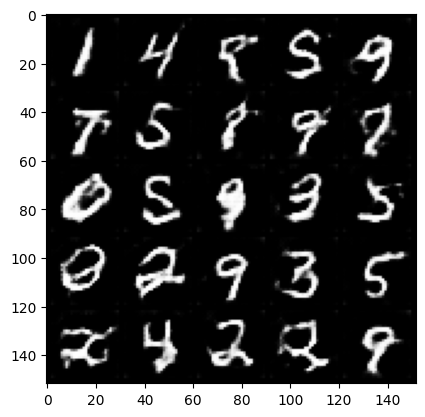

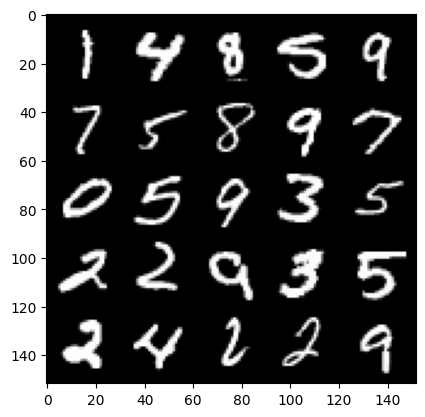

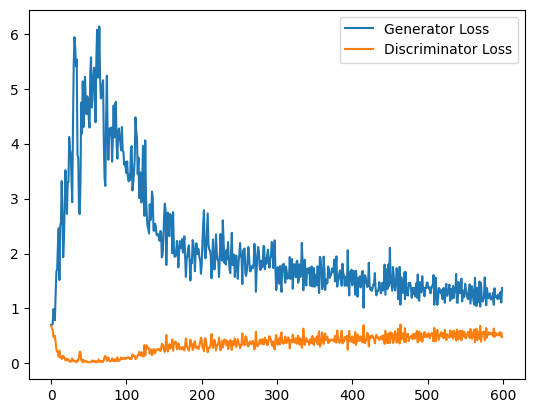

  0%|          | 0/469 [00:00<?, ?it/s]

Step 12300: Generator loss: 1.1826985261837641, discriminator loss: 0.5462089128295581


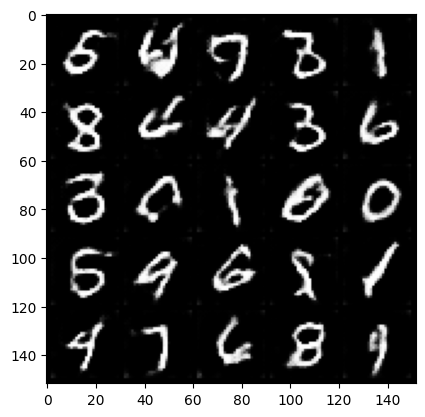

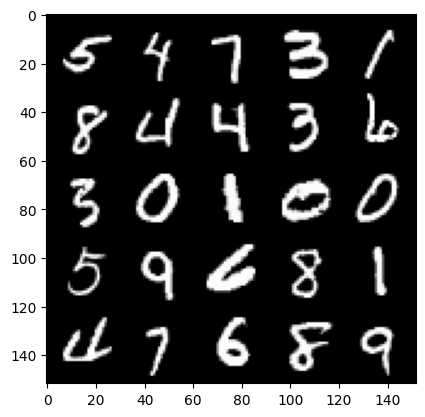

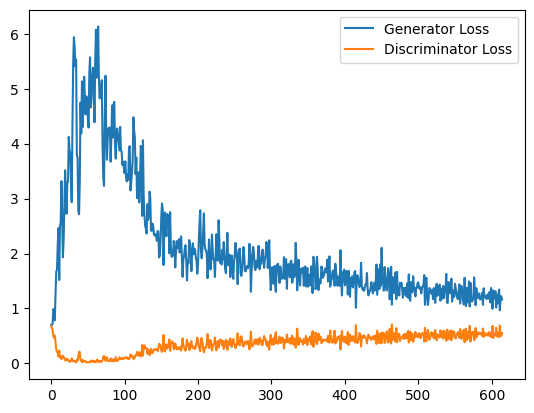

Step 12600: Generator loss: 1.200295856197675, discriminator loss: 0.5513102766871453


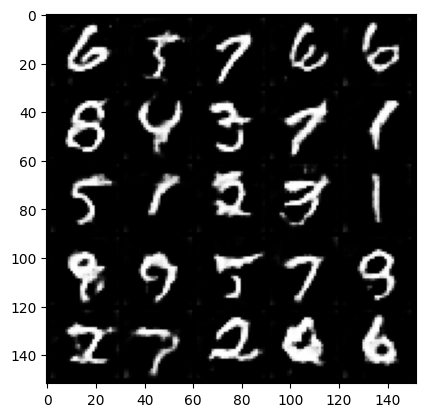

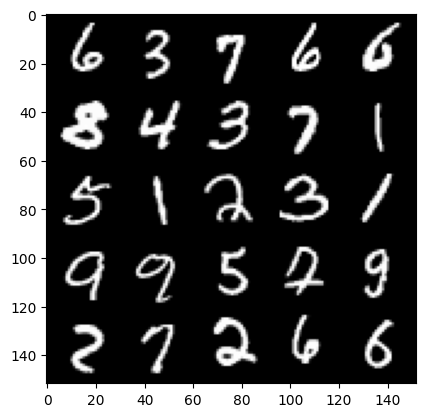

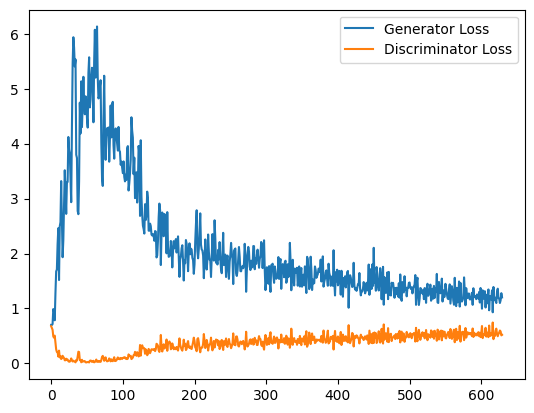

  0%|          | 0/469 [00:00<?, ?it/s]

Step 12900: Generator loss: 1.1770075460275014, discriminator loss: 0.545612481534481


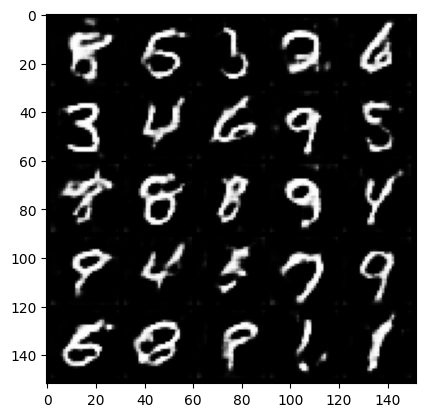

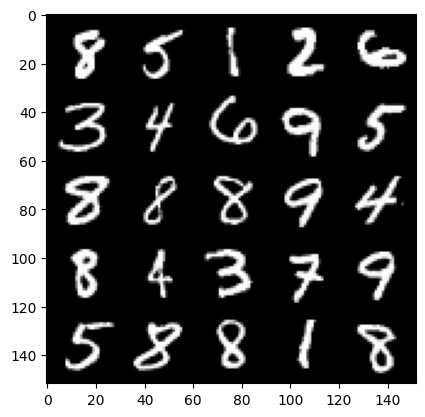

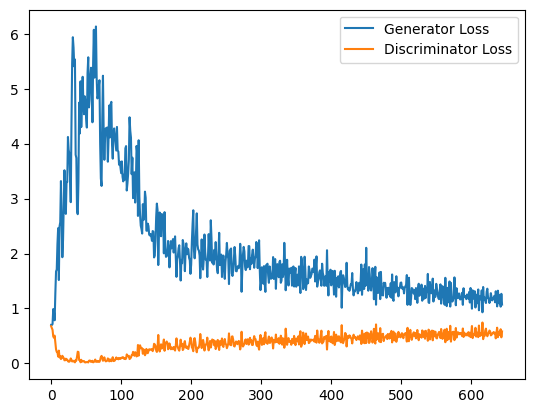

  0%|          | 0/469 [00:00<?, ?it/s]

Step 13200: Generator loss: 1.1540565488735834, discriminator loss: 0.5573226516445478


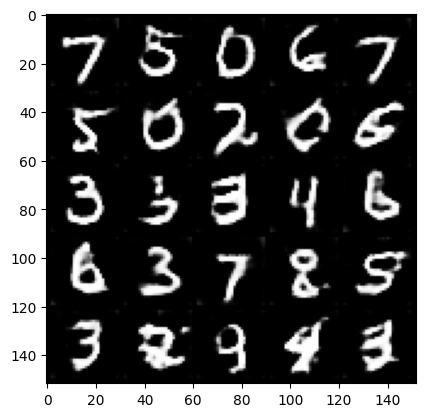

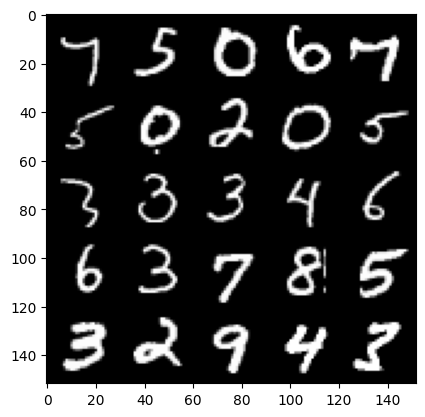

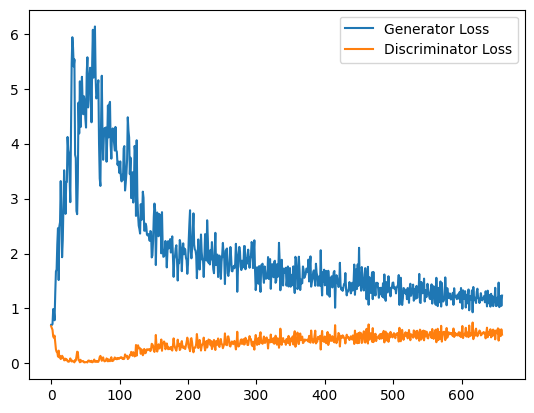

Step 13500: Generator loss: 1.1472982293367386, discriminator loss: 0.5584970414638519


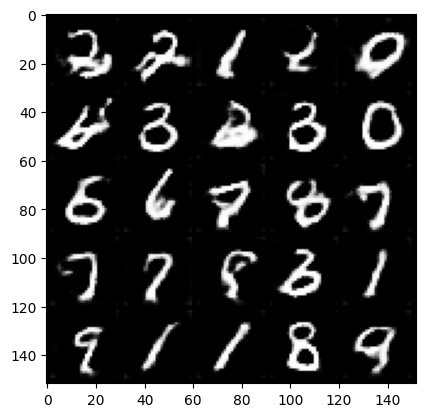

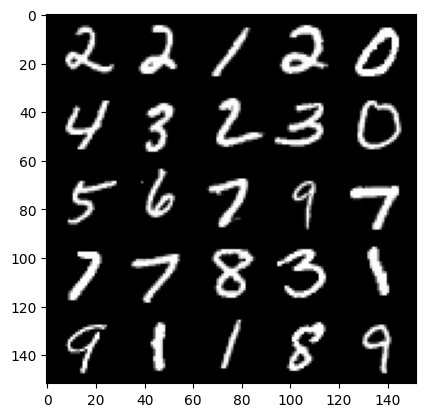

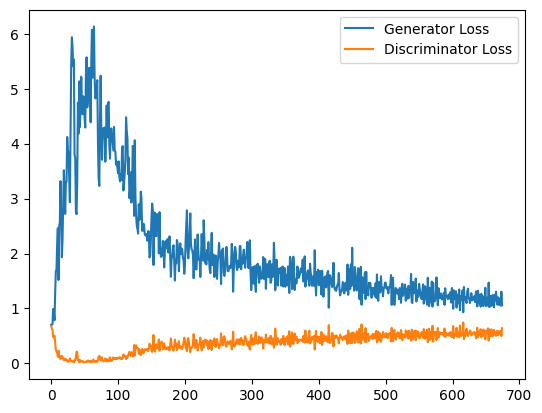

  0%|          | 0/469 [00:00<?, ?it/s]

Step 13800: Generator loss: 1.1551326368252437, discriminator loss: 0.5509728651245435


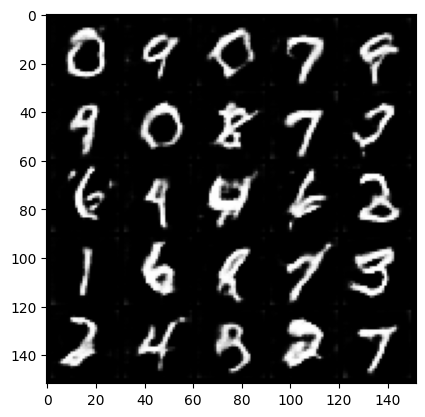

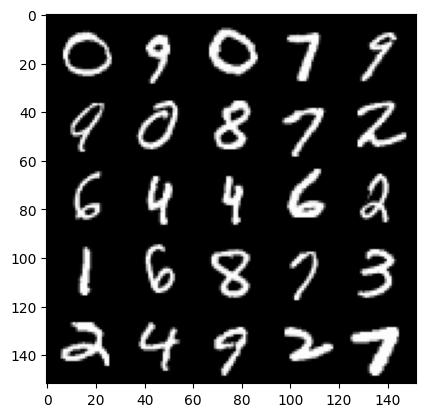

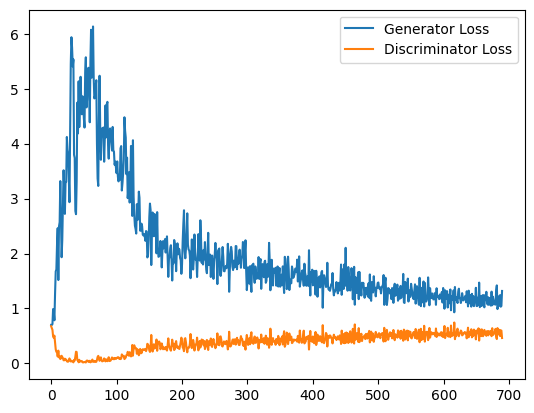

In [12]:
cur_step = 0
generator_losses = []
discriminator_losses = []

for epoch in range(n_epochs):
    # Dataloader returns the batches and the labels
    for real, labels in tqdm(dataloader):
        cur_batch_size = len(real)
        # Flatten the batch of real images from the dataset
        real = real.to(device)

        one_hot_labels = get_one_hot_labels(labels.to(device), n_classes)
        image_one_hot_labels = one_hot_labels[:, :, None, None]
        image_one_hot_labels = image_one_hot_labels.repeat(1, 1, img_shape[1], img_shape[2])
       

        ### Update discriminator ###
        # Zero out the discriminator gradients
        disc_opt.zero_grad()
        # Get noise corresponding to the current batch_size 
        fake_noise = get_noise(cur_batch_size, z_dim, device=device)
    
        
        # Now you can get the images from the generator
        # Steps: 1) Combine the noise vectors and the one-hot labels for the generator
        #        2) Generate the conditioned fake images
       
        noise_and_labels = combine_vectors(fake_noise, one_hot_labels)
        fake = gen(noise_and_labels)
        

        # Now you can get the predictions from the discriminator
        # Steps: 1) Create the input for the discriminator
        #           a) Combine the fake images with image_one_hot_labels, 
        #              remember to detach the generator (.detach()) so you do not backpropagate through it
        #           b) Combine the real images with image_one_hot_labels
        #        2) Get the discriminator's prediction on the fakes as disc_fake_pred
        #        3) Get the discriminator's prediction on the reals as disc_real_pred
        #print(fake.shape)
        #print(image_one_hot_labels.shape)
        fake_image_and_labels = combine_vectors(fake, image_one_hot_labels)
        real_image_and_labels = combine_vectors(real, image_one_hot_labels)
        disc_fake_pred = disc(fake_image_and_labels.detach())
        disc_real_pred = disc(real_image_and_labels)        
        
        disc_fake_loss = criterion(disc_fake_pred, torch.zeros_like(disc_fake_pred))
        disc_real_loss = criterion(disc_real_pred, torch.ones_like(disc_real_pred))
        disc_loss = (disc_fake_loss + disc_real_loss) / 2
        disc_loss.backward(retain_graph=True)
        disc_opt.step() 

        # Keep track of the average discriminator loss
        discriminator_losses += [disc_loss.item()]

        ### Update generator ###
        # Zero out the generator gradients
        gen_opt.zero_grad()

        fake_image_and_labels = combine_vectors(fake, image_one_hot_labels)
        # This will error if you didn't concatenate your labels to your image correctly
        disc_fake_pred = disc(fake_image_and_labels)
        gen_loss = criterion(disc_fake_pred, torch.ones_like(disc_fake_pred))
        gen_loss.backward()
        gen_opt.step()

        # Keep track of the generator losses
        generator_losses += [gen_loss.item()]
        #

        if cur_step % display_step == 0 and cur_step > 0:
            gen_mean = sum(generator_losses[-display_step:]) / display_step
            disc_mean = sum(discriminator_losses[-display_step:]) / display_step
            print(f"Step {cur_step}: Generator loss: {gen_mean}, discriminator loss: {disc_mean}")
            show_tensor_images(fake)
            show_tensor_images(real)
            step_bins = 20
            x_axis = sorted([i * step_bins for i in range(len(generator_losses) // step_bins)] * step_bins)
            num_examples = (len(generator_losses) // step_bins) * step_bins
            plt.plot(
                range(num_examples // step_bins), 
                torch.Tensor(generator_losses[:num_examples]).view(-1, step_bins).mean(1),
                label="Generator Loss"
            )
            plt.plot(
                range(num_examples // step_bins), 
                torch.Tensor(discriminator_losses[:num_examples]).view(-1, step_bins).mean(1),
                label="Discriminator Loss"
            )
            plt.legend()
            plt.show()
       
        cur_step += 1


### Model evaluation

FID is a measure of the difference between the real and fake image distributions, with lower values indicating better performance, while IS is a measure of the diversity and quality of the generated images, with higher values indicating better performance. Both metrics should be used together to evaluate the performance of a GAN.